In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 


### Plot Speed controller for Ki only

In [ ]:
csv_file = "../data/pid/factorial.csv"

df = pd.read_csv(csv_file)

fixed_speed = df['target_speed'][0]
# plot observed speed on Y with time on X
# group by ki 

for ki, group in df.groupby('ki'):

    x = group['time']
    y = group['observed_speed']
    fixed_speed_array = np.ones(len(x)) * fixed_speed

    plt.plot(x, y, label='observed speed') 
    plt.plot(x, fixed_speed_array, label='desired speed')
    plt.xlabel('time (s)')
    plt.ylabel('speed (m/s)')
    plt.title(f'ki = {ki}')

    plt.yticks(np.arange(0.0, 2.2, 0.2))

    plt.legend()
    plt.savefig(f'../plots/pid/factorial_ki_{ki}.png')
    plt.show()

### Plot Speed controller for Kp and Ki

In [ ]:
csv_file = "../data/pid/factorial.csv"

df = pd.read_csv(csv_file)

def make_speed_PI_controller_plot():
    fixed_speed = df['target_speed'][0]
    # plot observed speed on Y with time on X
    # group by ki 
    for kp, kp_group in df.groupby('kp'):
        for ki, group in kp_group.groupby('ki'):

            x = group['time']
            y = group['observed_speed']
            fixed_speed_array = np.ones(len(x)) * fixed_speed

            plt.plot(x, y, label='observed speed') 
            plt.plot(x, fixed_speed_array, label='desired speed')
            plt.xlabel('time (s)')
            plt.ylabel('speed (m/s)')
            plt.title(f'PI controller with kp = {kp} and ki = {ki}')

            increment = 0.2
            plt.yticks(np.arange(0.0, 2.0 * fixed_speed + increment, increment))

            plt.legend()
            plt.savefig(f'../plots/pid/kp_ki/{kp}_{ki}.png')
            plt.show()

make_speed_PI_controller_plot()

In [ ]:
def make_PI_plot(df):
    fixed_speed = df['target_speed'][0]
    fixed_distance = 0.0 
    # plot observed speed on Y with time on X
    # group by ki 
    for kp, kp_group in df.groupby('kp'):
        for ki, group in kp_group.groupby('ki'):
            # subplot 2 columns 1 row
            _, ax = plt.subplots(2, 1, figsize=(10, 10))

            x = group['iteration']
            ## normalize x -> removing min value to all values
            x = x - np.min(x)


            y = group['observed_speed']
            fixed_speed_array = np.ones(len(x)) * fixed_speed

            ### plot speed
            ax[0].plot(x, y, label='observed speed') 
            ax[0].plot(x, fixed_speed_array, label='desired speed')
            ax[0].set_xlabel('number of iterations')
            ax[0].set_ylabel('speed (m/s)')
            ax[0].set_title(f'PI controller with kp = {kp} and ki = {ki}')

            increment = 0.2
            ax[0].set_yticks(np.arange(0.0, 2.0 * fixed_speed + increment, increment))

            ### plot distance
            ax[1].plot(x, group['observed_distance'], label='distance')
            ax[1].plot(x, np.zeros(len(x)), label='desired distance')
            ax[1].set_xlabel('number of iterations')
            ax[1].set_ylabel('distance (m)')
            ax[1].set_title(f'PI controller with kp = {kp} and ki = {ki}')

            ax[1].set_yticks(np.arange(-1.0, 1.0 + increment, increment))

            plt.legend()
            plt.savefig(f'../plots/pid/kp_ki/{kp}_{ki}.png')
            plt.show()

csv_file = "../data/pid/PI_controller.csv"
df = pd.read_csv(csv_file)
make_PI_plot(df)

### PLOT PID controller

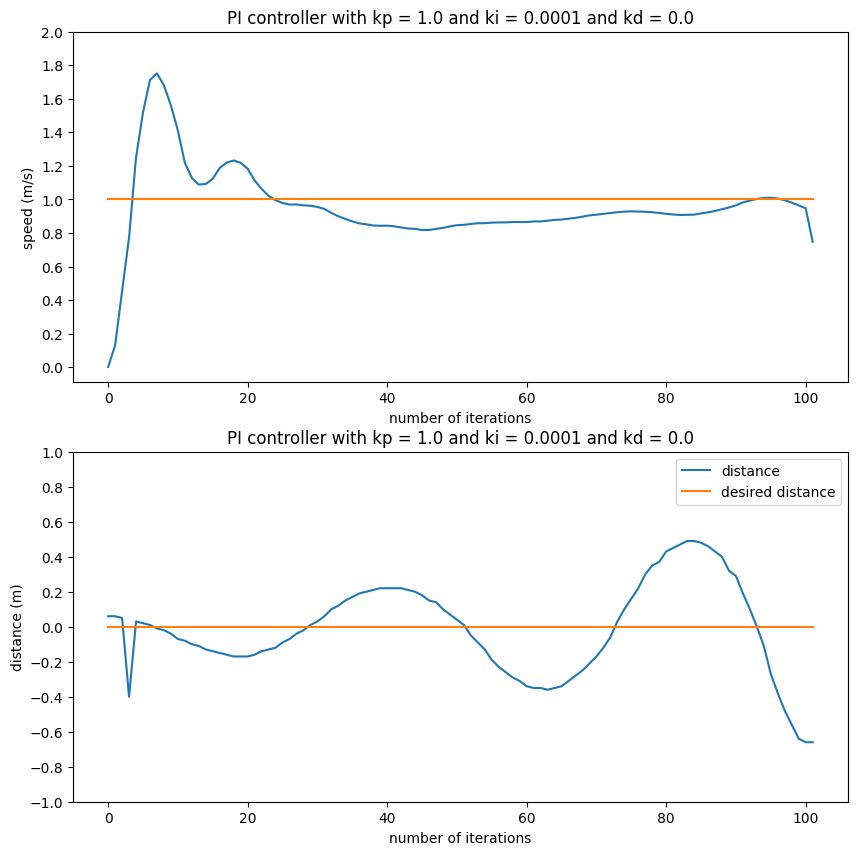

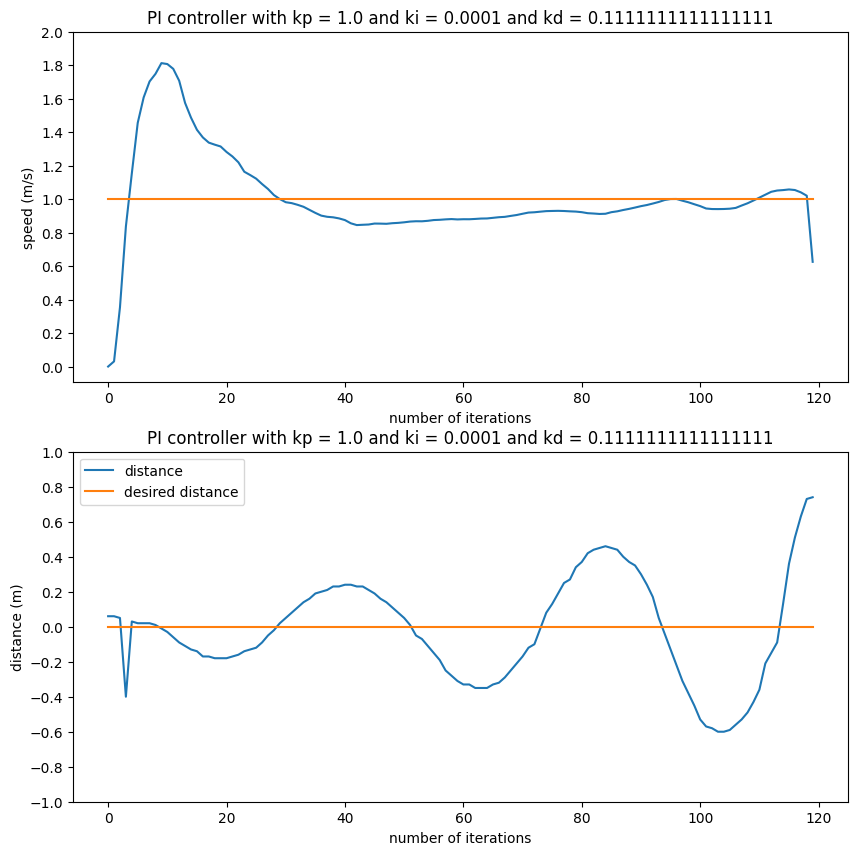

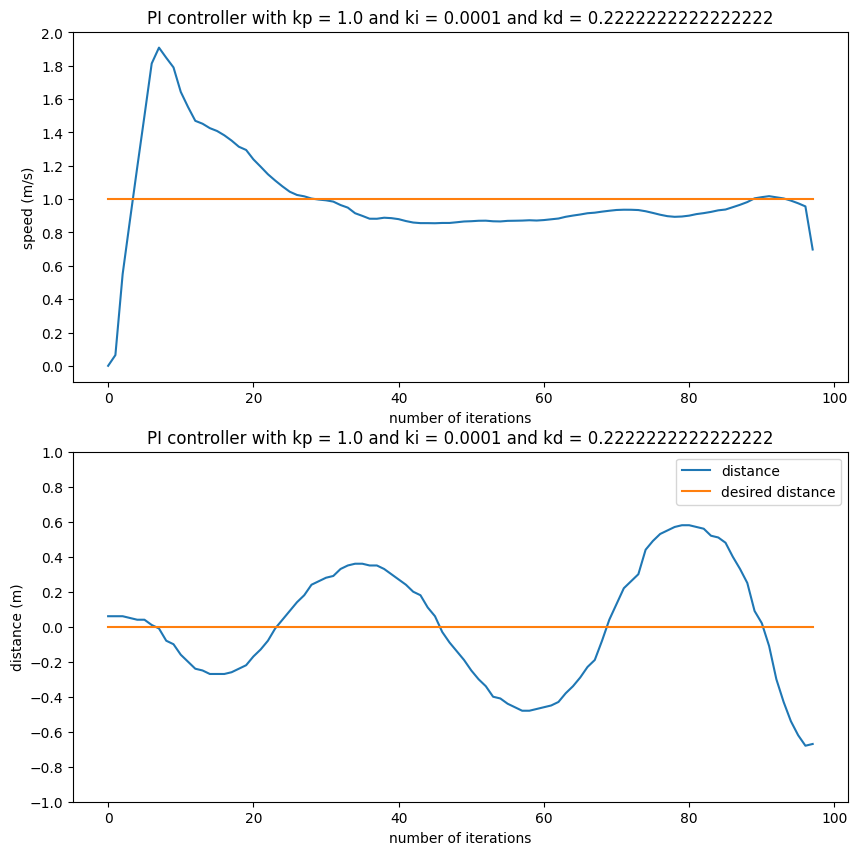

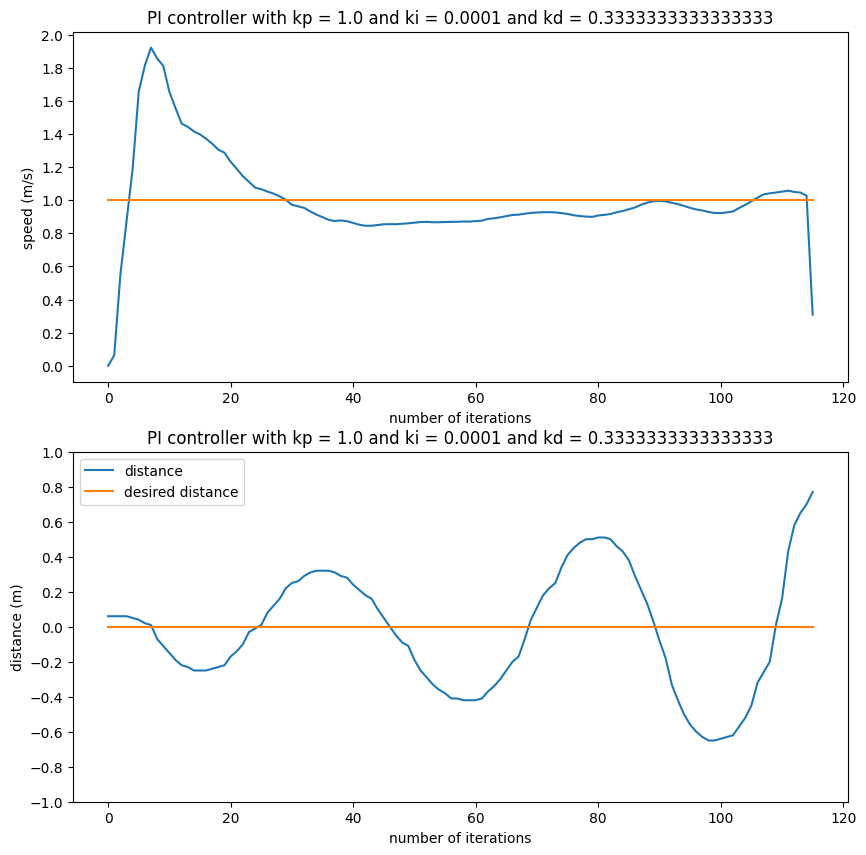

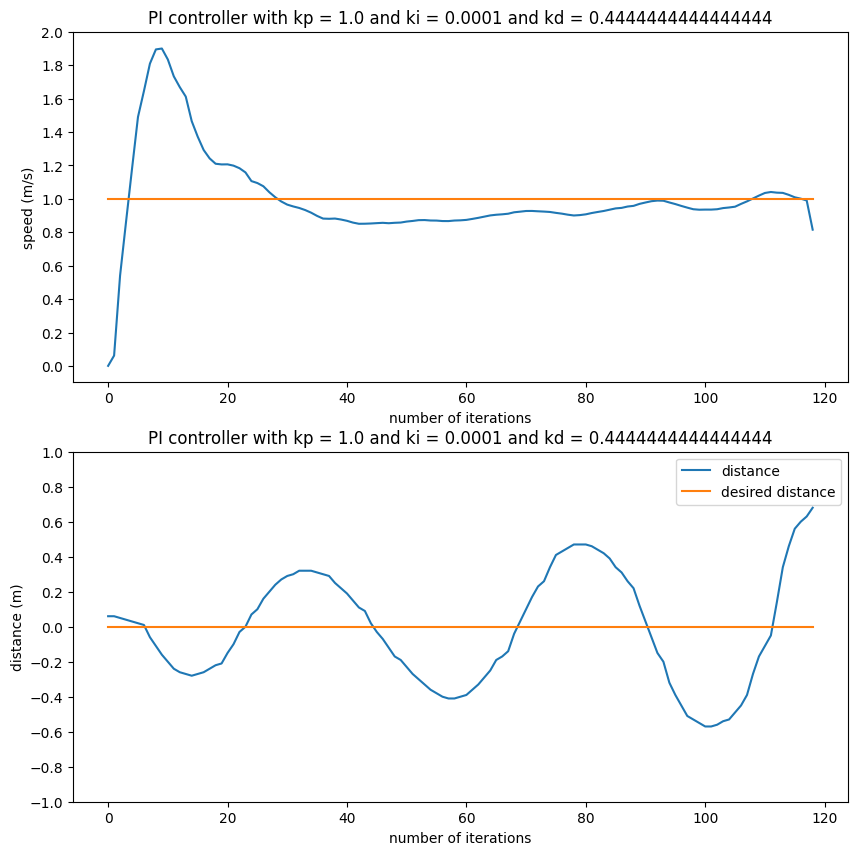

...

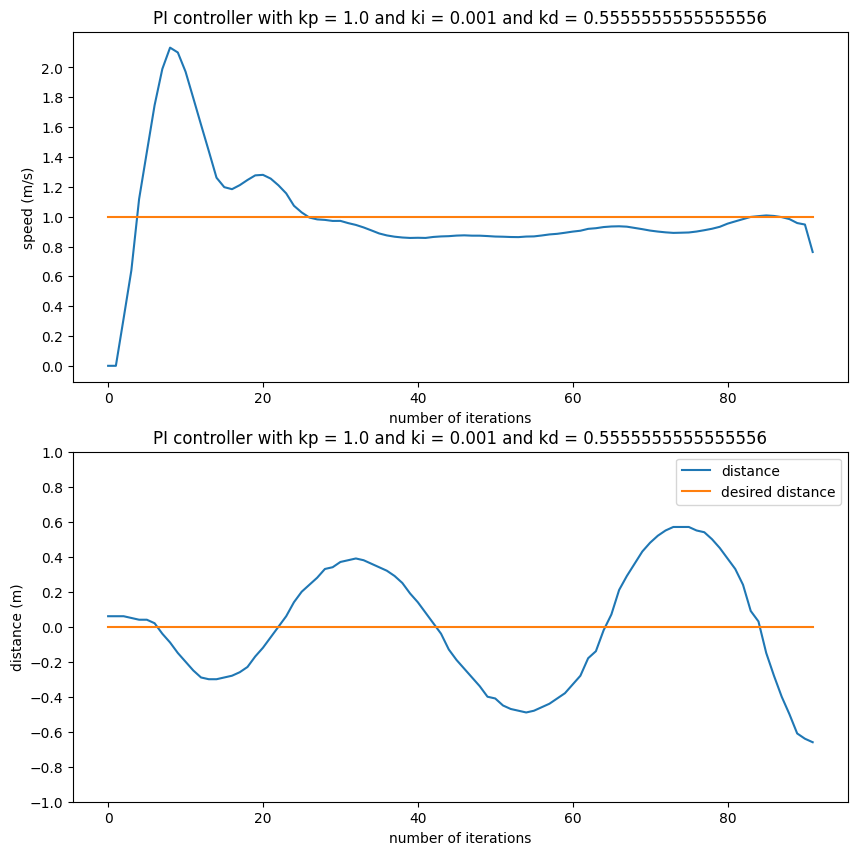

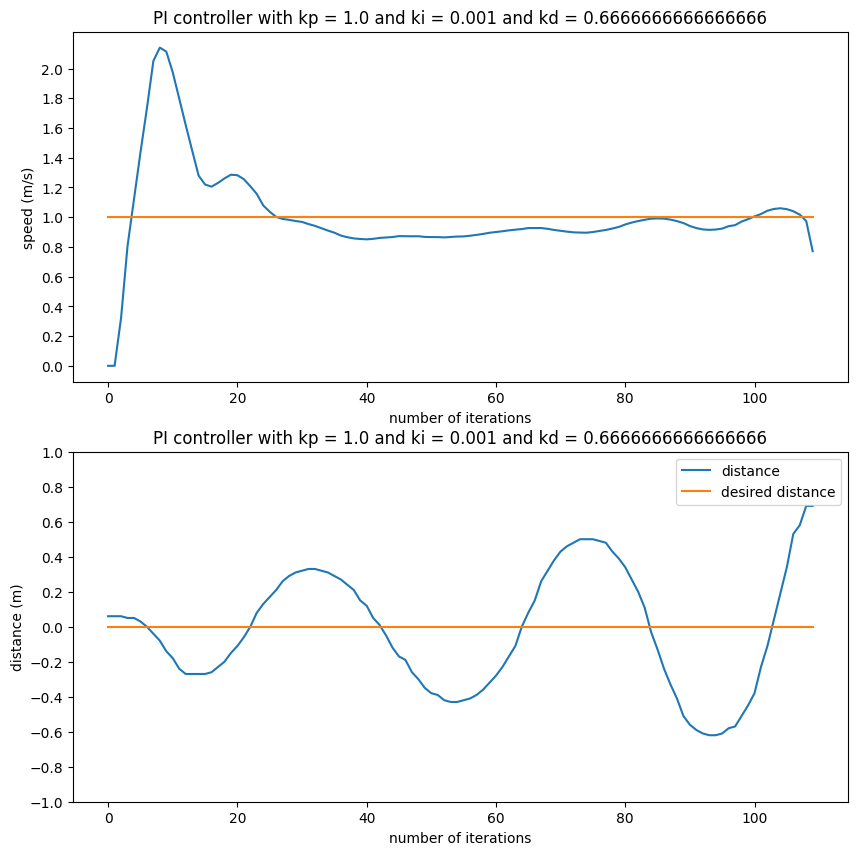

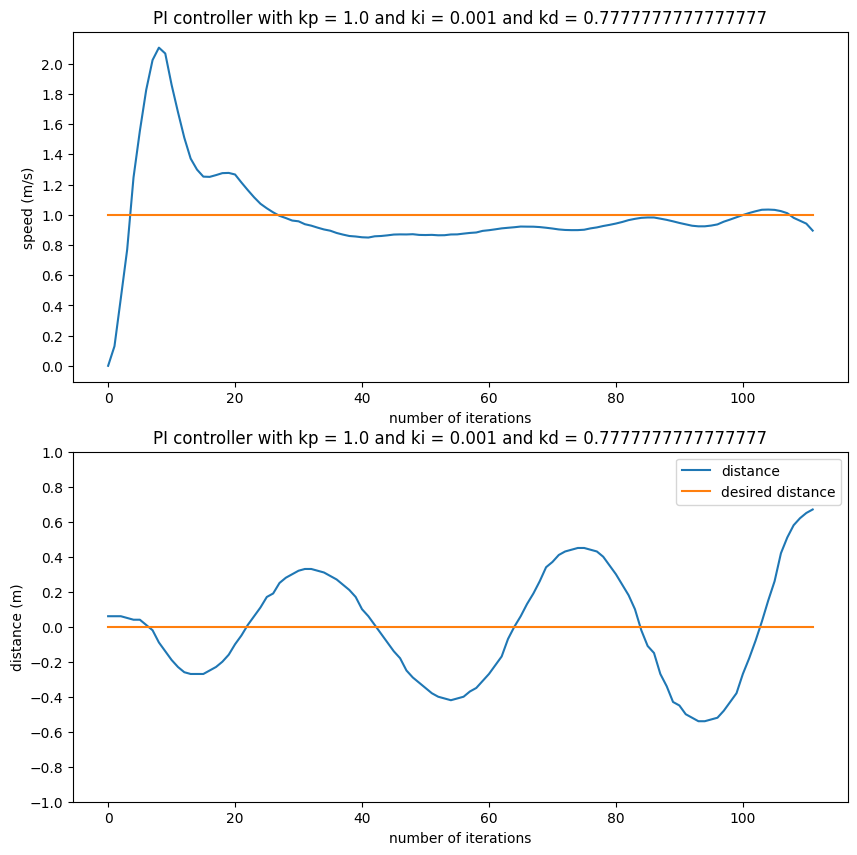

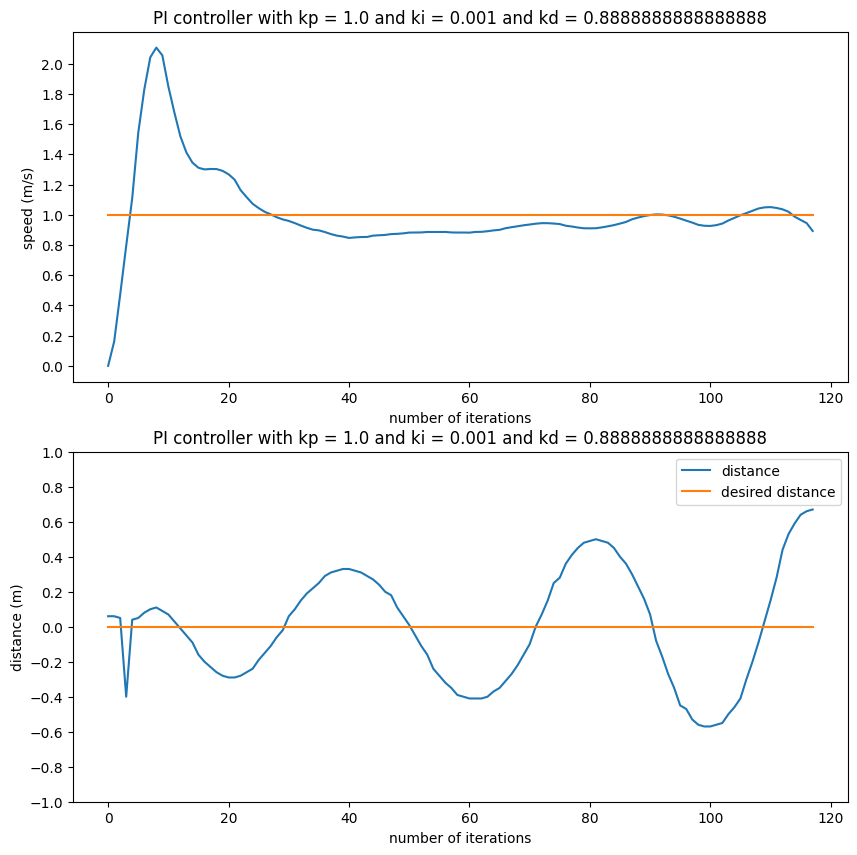

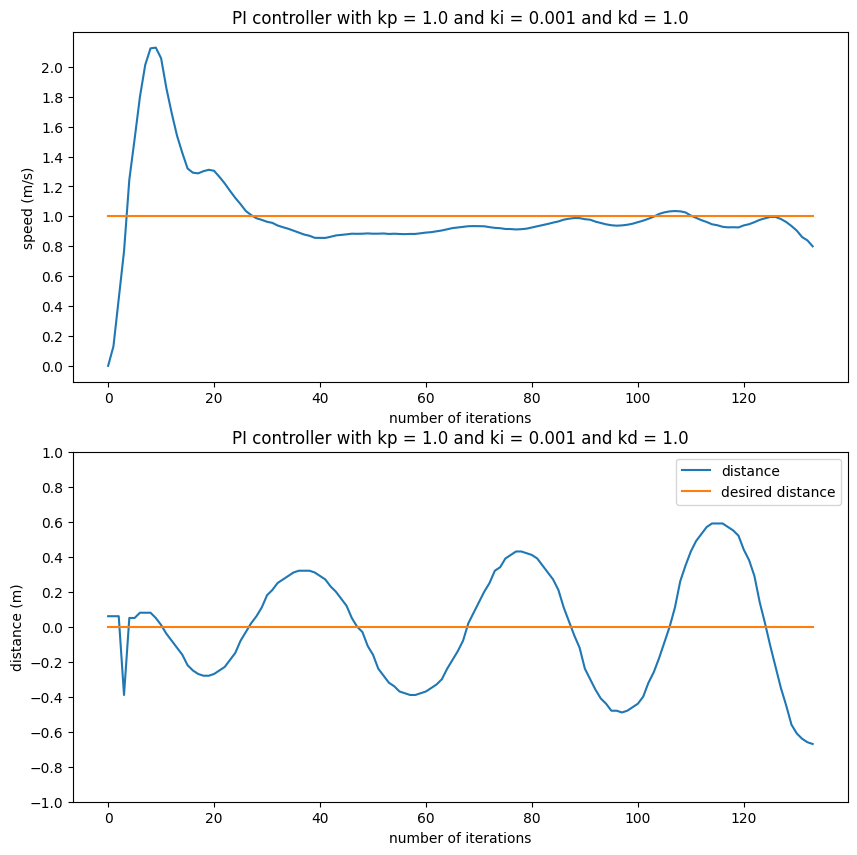

In [21]:
def make_PID_plot(df):
    fixed_speed = df['target_speed'][0]
    fixed_distance = 0.0 
    # plot observed speed on Y with time on X
    # group by ki 
    for kp, kp_group in df.groupby('kp'):
        for ki, ki_group in kp_group.groupby('ki'):
            for kd, group in ki_group.groupby('kd'):
                # subplot 2 columns 1 row
                _, ax = plt.subplots(2, 1, figsize=(10, 10))

                x = group['iteration']
                ## normalize x -> removing min value to all values
                x = x - np.min(x)


                y = group['observed_speed']
                fixed_speed_array = np.ones(len(x)) * fixed_speed

                ### plot speed
                ax[0].plot(x, y, label='observed speed') 
                ax[0].plot(x, fixed_speed_array, label='desired speed')
                ax[0].set_xlabel('number of iterations')
                ax[0].set_ylabel('speed (m/s)')
                ax[0].set_title(f'PI controller with kp = {kp} and ki = {ki} and kd = {kd}')

                increment = 0.2
                ax[0].set_yticks(np.arange(0.0, 2.0 * fixed_speed + increment, increment))

                ### plot distance
                ax[1].plot(x, group['observed_distance'], label='distance')
                ax[1].plot(x, np.zeros(len(x)), label='desired distance')
                ax[1].set_xlabel('number of iterations')
                ax[1].set_ylabel('distance (m)')
                ax[1].set_title(f'PI controller with kp = {kp} and ki = {ki} and kd = {kd}')

                ax[1].set_yticks(np.arange(-1.0, 1.0 + increment, increment))

                plt.legend()
                plt.savefig(f'../plots/pid/factorial_pid/{kp}_{ki}_{kd}.png')
                plt.show()

csv_file = "../data/pid/PI_controller.csv"
df = pd.read_csv(csv_file)
make_PID_plot(df)

### Plot tuned pid

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import pandas as pd
# from pathlib import Path

# df = pd.read_csv("../data/ziegler_nichols/pid_tuning.csv")

# target_speed = df["target_speed"].values[0]
# unique_kp = df["kp"].unique()

# # mkdir -p ../plots/ziegler_nichols/speed_controller_08 if not exists
# directory_path = "../plots/ziegler_nichols/pid_controller"
# if not Path(directory_path).exists():
#     Path(directory_path).mkdir(parents=True)

# for i, kp in enumerate(unique_kp):
#     df_kp = df[df["kp"] == kp]
#     # subplot with 2 rows and 1 column
#     fig, ax = plt.subplots(2, 1, figsize=(10, 10))

#     dataframe_length = len(df_kp["time"])

#     ax[0].plot(df_kp["time"], df_kp["observed_speed"], label="observed_speed")
#     ax[0].plot(df_kp["time"], np.ones(dataframe_length) * target_speed, label="target speed")
#     ax[0].plot(df_kp["time"], np.zeros(dataframe_length), label="zero speed")
#     ax[0].set_title(f"observed speed during tuning")
#     ax[0].legend()

#     ax[1].plot(df_kp["time"], df_kp["observed_distance"], label="observed_distance")
#     ax[1].plot(df_kp["time"], np.zeros(len(df_kp["time"])), label="target distance")
#     ax[1].set_title(f"observed distance from middle line with kp = {kp}")
#     ax[1].legend()

#     plt.savefig(f"{directory_path}/pid_tuning_{kp}.png")
#     plt.show()

### plot speed controller

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import pandas as pd
# from pathlib import Path

# df = pd.read_csv("../donkey_environment/ziegler_nichols_speed_iterations_0.25.csv")


# target_speed = df["target_speed"].values[0]
# unique_kp = df["kp"].unique()

# # mkdir -p ../plots/ziegler_nichols/speed_controller_08 if not exists
# directory_path = "../plots/ziegler_nichols/speed_controller_0.25"
# if not Path(directory_path).exists():
#     Path(directory_path).mkdir(parents=True)

# for i, kp in enumerate(unique_kp):
#     df_kp = df[df["kp"] == kp]
#     plt.plot(df_kp["iterations"], df_kp["observed_speed"], label="observed_speed")
#     plt.plot(df_kp["iterations"], np.ones(len(df_kp["iterations"])) * target_speed, label="target speed")
#     plt.title(f"kp = {kp}")
#     plt.legend()
#     plt.savefig(f"{directory_path}/observed_speed_{kp}.png")
#     plt.show()

### plot best pid

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import pandas as pd
# from pathlib import Path

# df = pd.read_csv("../data/ziegler_nichols/best_parameters.csv")

# target_speed = df["target_speed"].values[0]

# # mkdir -p ../plots/ziegler_nichols/speed_controller_08 if not exists
# directory_path = "../plots/ziegler_nichols/pid_controller"
# if not Path(directory_path).exists():
#     Path(directory_path).mkdir(parents=True)


# fig, ax = plt.subplots(2, 1, figsize=(10, 10))
# dataframe_length = len(df["time"])

# ax[0].plot(df["time"], df["observed_speed"], label="observed_speed")
# ax[0].plot(df["time"], np.ones(dataframe_length) * target_speed, label="target speed")
# ax[0].plot(df["time"], np.zeros(dataframe_length), label="zero speed")
# ax[0].set_title(f"observed speed")
# ax[0].legend()

# ax[1].plot(df["time"], df["observed_distance"], label="observed_distance")
# ax[1].plot(df["time"], np.zeros(len(df["time"])), label="target distance")
# ax[1].set_title(f"observed distance from middle line")
# ax[1].legend()

# plt.savefig(f"{directory_path}/best_pid.png")
# plt.show()